In [ ]:
# Download YOLOv6 repository and install requirements
!git clone https://github.com/meituan/YOLOv6
%cd YOLOv6
!pip install -r requirements.txt

Cloning into 'YOLOv6'...
remote: Enumerating objects: 1435, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 1435 (delta 10), reused 16 (delta 8), pack-reused 1413
Receiving objects: 100% (1435/1435), 10.02 MiB | 26.32 MiB/s, done.
Resolving deltas: 100% (783/783), done.
/content/YOLOv6
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 596 kB 5.2 MB/s 
     |████████████████████████████████| 13.1 MB 26.6 MB/s 
     |████████████████████████████████| 2.0 MB 41.1 MB/s 
     |████████████████████████████████| 235 kB 66.0 MB/s 
     |████████████████████████████████| 51 kB 8.3 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
!unzip -q ../New_Data.zip -d ../

# **Training**

In [ ]:
!python tools/train.py --batch 10 --conf configs/yolov6n.py --epochs 150 --img-size 416 --data './data/dataset.yaml' --device 0 

Using 1 GPU for training... 
training args are: Namespace(batch_size=10, check_images=False, check_labels=False, conf_file='configs/yolov6n.py', data_path='./data/dataset.yaml', device='0', dist_url='env://', epochs=150, eval_final_only=False, eval_interval=20, gpu_count=0, heavy_eval_range=50, img_size=416, local_rank=-1, name='exp', output_dir='./runs/train', rank=-1, resume=False, save_dir='runs/train/exp', workers=8, world_size=1, write_trainbatch_tb=False)

Train: Checking formats of images with 2 process(es): 
0 image(s) corrupted: 100% 784/784 [00:00<00:00, 5317.63it/s]
Train: Checking formats of labels with 2 process(es): 
784 label(s) found, 0 label(s) missing, 0 label(s) empty, 0 invalid label files: 100% 784/784 [00:00<00:00, 4480.50it/s]
Train: Final numbers of valid images: 784/ labels: 784. 
0.5s for dataset initialization.
Val: Checking formats of images with 2 process(es): 
0 image(s) corrupted: 100% 98/98 [00:00<00:00, 2781.39it/s]
Val: Checking formats of labels with 

# **Evaluation**

In [ ]:
# Run evaluation
!python tools/eval.py --data './data/dataset.yaml' --img-size 416 --weights runs/train/exp/weights/best_ckpt.pt --device 0 

Namespace(batch_size=32, conf_thres=0.001, data='./data/dataset.yaml', device='0', half=False, img_size=416, iou_thres=0.65, name='exp', save_dir='runs/val/', task='val', weights='runs/train/exp/weights/best_ckpt.pt')
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Switch model to deploy modality.
Model Summary: Params: 4.30M, Gflops: 4.68
Val: Checking formats of labels with 2 process(es): 
98 label(s) found, 0 label(s) missing, 0 label(s) empty, 0 invalid label files: 100% 98/98 [00:00<00:00, 7897.21it/s]
Convert to COCO format
100% 98/98 [00:00<00:00, 150564.76it/s]
Convert to COCO format finished. Resutls saved in ../New_Data/annotations/instances

# **Inference**

In [ ]:
# Infer on all images in the /test directory
!python tools/infer.py --yaml './data/dataset.yaml' --img-size 416 --weights runs/train/exp/weights/best_ckpt.pt --source '../New_Data/images/test/' --device 0

Namespace(agnostic_nms=False, classes=None, conf_thres=0.25, device='0', half=False, hide_conf=False, hide_labels=False, img_size=416, iou_thres=0.45, max_det=1000, name='exp', project='runs/inference', save_img=True, save_txt=False, source='../New_Data/images/test/', view_img=False, weights='runs/train/exp/weights/best_ckpt.pt', yaml='./data/dataset.yaml')
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Switch model to deploy modality.
100% 98/98 [00:02<00:00, 35.94it/s]
Results saved to runs/inference/exp


# **Display Results**

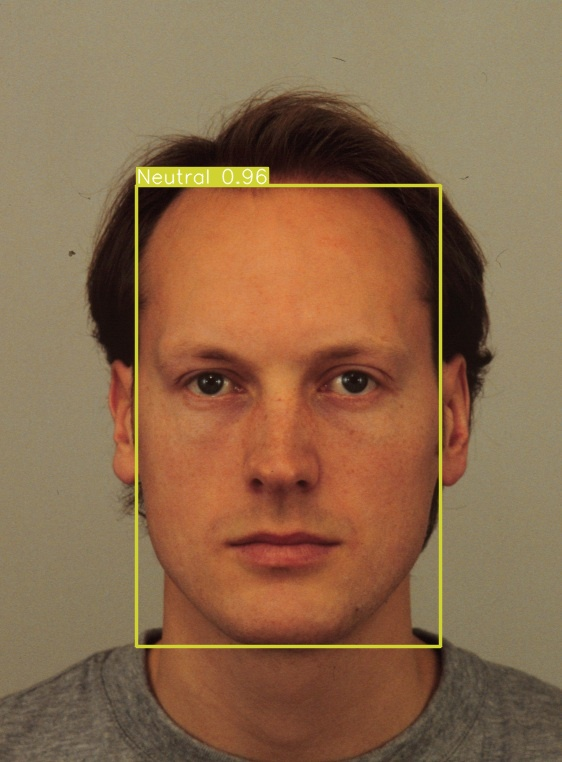

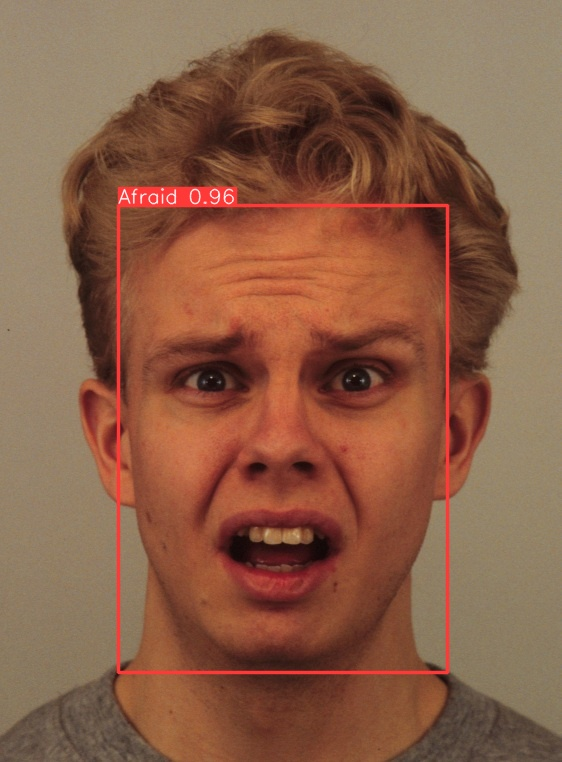

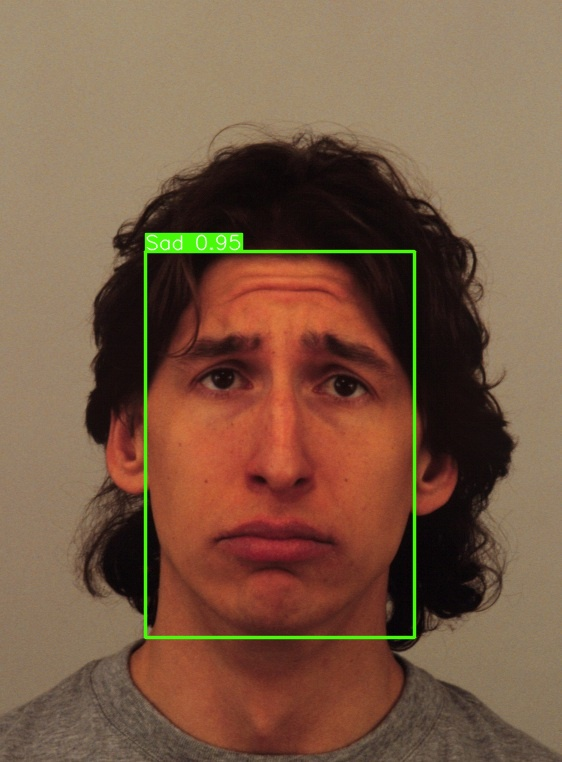

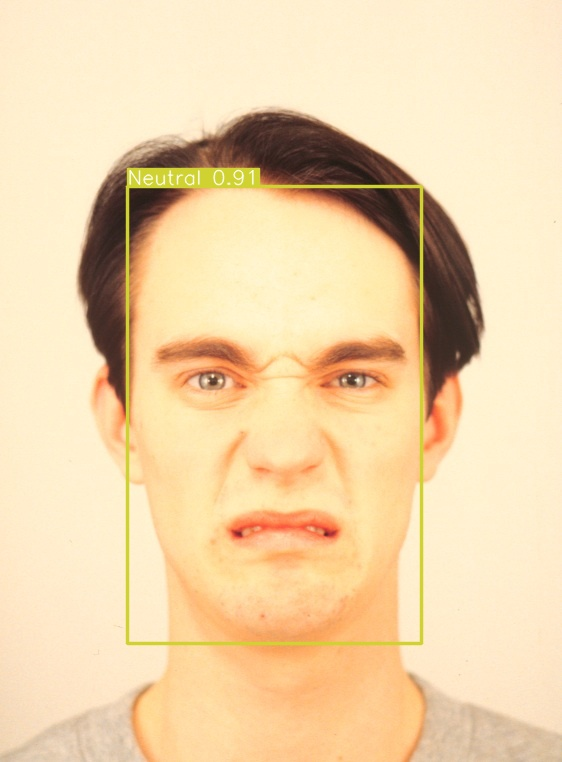

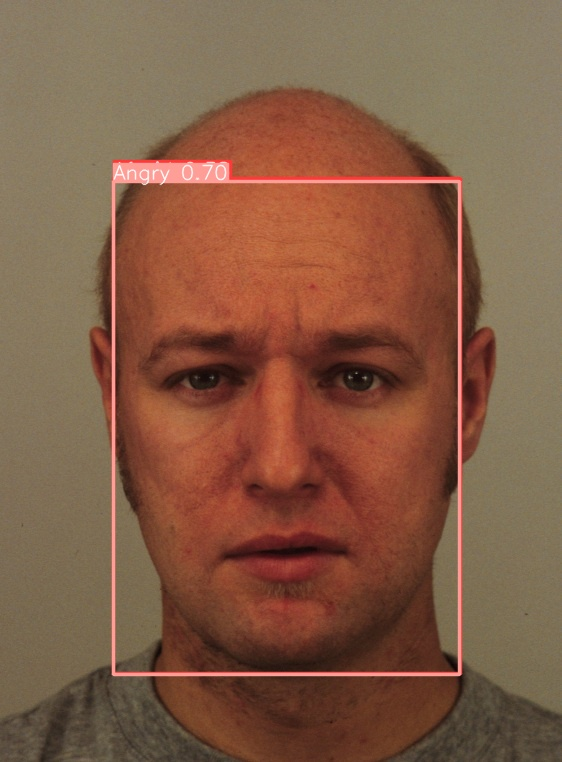

...

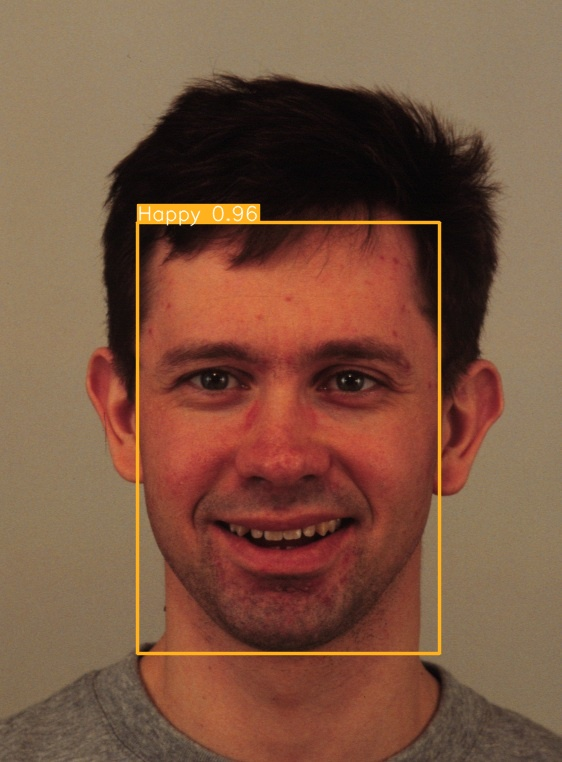

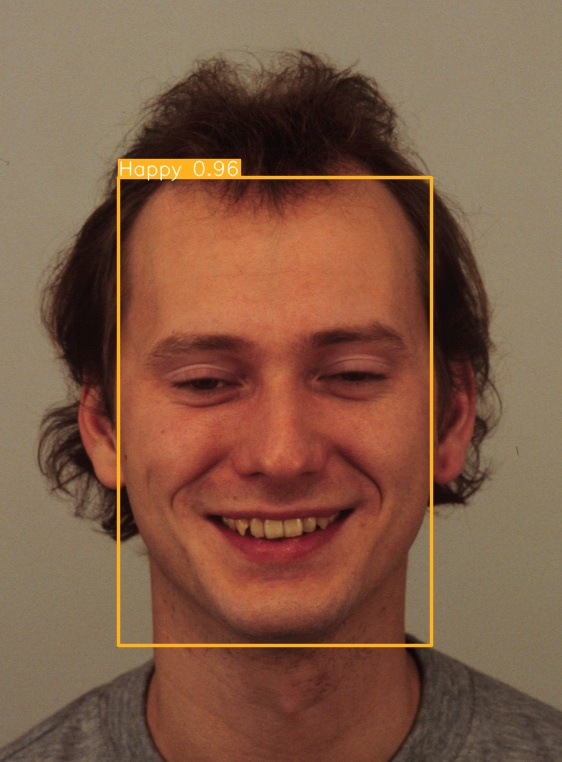

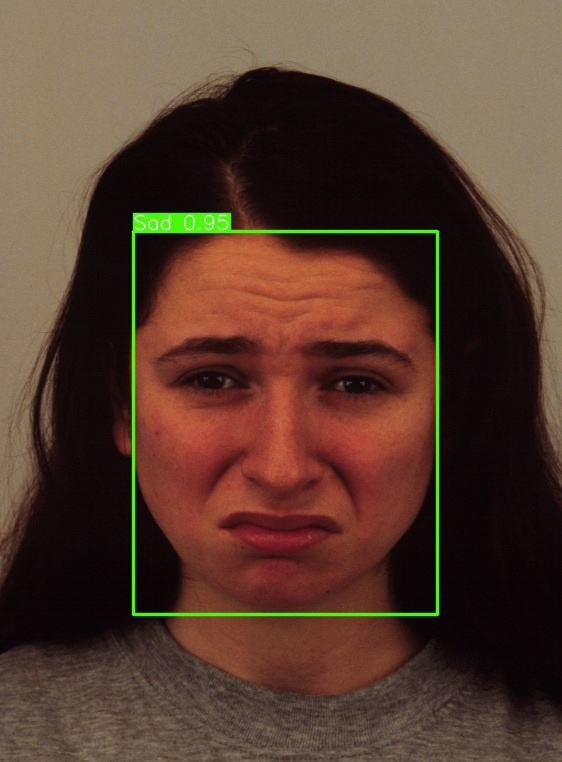

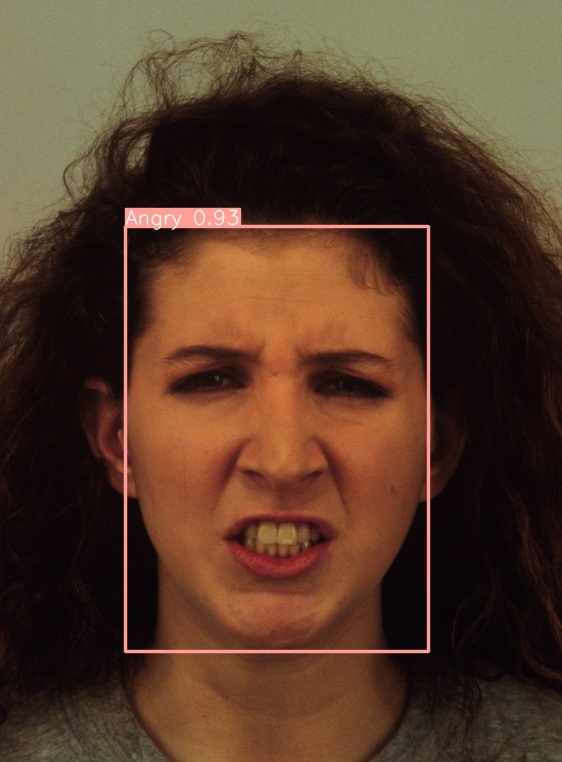

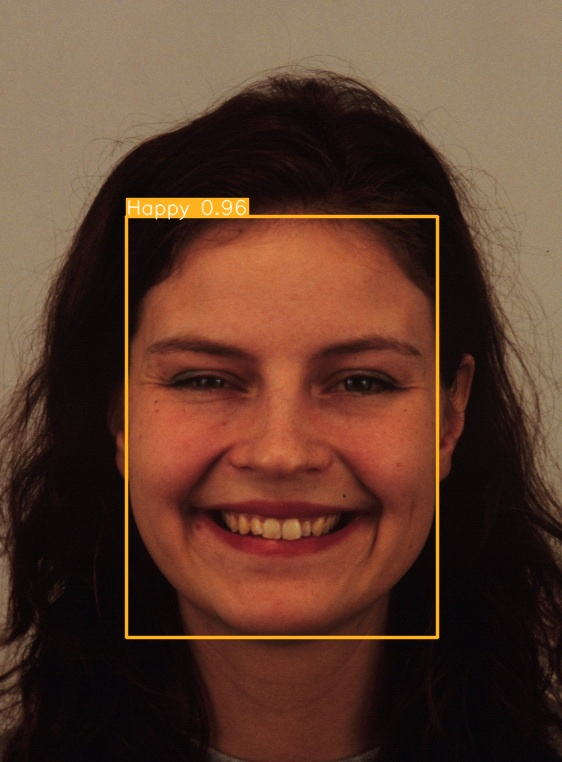

In [ ]:
# display test inference result images
import glob
from IPython.display import Image, display

i = 0
limit = 100 # max images to print
for imageName in glob.glob('./runs/inference/exp/*.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python deploy/ONNX/export_onnx.py --weights runs/train/exp/weights/best_ckpt.pt --device 0

Namespace(batch_size=1, conf_thres=0.25, device='0', end2end=False, half=False, img_size=[640, 640], inplace=False, iou_thres=0.45, max_wh=None, simplify=False, topk_all=100, trt_version=8, weights='runs/train/exp/weights/best_ckpt.pt', with_preprocess=False)
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

Starting to export ONNX...
/content/YOLOv6/yolov6/models/effidehead.py:76: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if self.